# <font color='Blue'>CS109 Project : Educational Oversight</font>
## Part 1 of 2: EDA Features abound! 

<img src="https://raw.githubusercontent.com/samin80/cs109-project/master/pencils.jpg" width=200 height=100/>

#Table of Contents
* [Get The Data](#get)
	* [Normalize it](#normal)
	* [Drinking from the data firehose ](#firehose)
		* [Enrollment](#enrollment)
            * [Race and Gender](#race and gender)
        * [Dropouts](#dropouts)
        * [Dropouts and Secondary Teachers](#pairplot)

The data files here that you read in are a collection of CSVs publically available from various sites.  

The columns are:

* `secondary_teachers`: 
* `total_rd_expenditures`: 
* `full_time_equivalent`: 
* `american_indian_alaska_native_female_grade_10`: 
* `american_indian_alaska_native_female_grade_11`: 
* `grade_11_students_enrollment`: 
* `american_indian_alaska_native_female_grade_12`: 
* `american_indian_alaska_native_male_grade_10`: 
* `american_indian_alaska_native_male_grade_11`: 
* `american_indian_alaska_native_male_grade_12`: 
* `asian_or_asian_pacific_islander_female_grade_10`: 
* `asian_or_asian_pacific_islander_female_grade_11`: 
* `no_of_sat_test_takers`: 
* `no_high_school_diploma`: 
* `high_school_or_equivalent`: 
* `some_college_less_than_4_yr_degree`: 
* `bachelors_degree_or_higher`: 
* `american_indian_alaska_native_male_grade_9`: 
* `american_indian_alaska_native_female_grade_9`: 
* `asian_or_asian_pacific_islander_male_grade_9`: 
* `asian_or_asian_pacific_islander_female_grade_9`: 
* `hispanic_male_grade_9`: 
* `hispanic_female_grade_9`: 
* `asian_or_asian_pacific_islander_female_grade_12`: 
* `asian_or_asian_pacific_islander_male_grade_10`: 
* `asian_or_asian_pacific_islander_male_grade_11`: 
* `asian_or_asian_pacific_islander_male_grade_12`: 
* `black_female_grade_10`: 
* `black_female_grade_11`: 
* `black_female_grade_12`: 
* `black_female_grade_9`: 
* `black_male_grade_10`: 
* `black_male_grade_11`: 
* `black_male_grade_12`: 
* `black_male_grade_9`: 
* `grade_10_dropouts`: 
* `grade_10_students_enrollment`: 
* `grade_11_dropouts`: 
* `grade_12_dropouts`: 
* `grade_12_students_enrollment`: 
* `grade_9_dropouts`: 
* `grade_9_students_enrollment`: 
* `grades_9_12_dropouts`: 
* `hispanic_female_grade_10`: 
* `hispanic_female_grade_11`: 
* `hispanic_female_grade_12`: 
* `hispanic_male_grade_10`: 
* `hispanic_male_grade_11`: 
* `hispanic_male_grade_12`: 
* `white_female_grade_10`: 
* `white_female_grade_11`: 
* `white_female_grade_12`: 
* `white_female_grade_9`: 
* `white_male_grade_10`: 
* `white_male_grade_11`: 
* `white_male_grade_12`: 
* `white_male_grade_9`: 
* `Public Grads`: 
* `Private Grads`: 
* `Total_grads`: 

In [79]:
%matplotlib inline
import numpy as np
import scipy as sp
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import pandas as pd
import time
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 100)
pd.set_option('display.notebook_repr_html', True)
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("poster")
from mpl_toolkits.basemap import Basemap as Basemap
from matplotlib.colors import rgb2hex
from matplotlib.patches import Polygon
# Note that you need to run Conda install to get Basemap!

##Get that data!!!<a id="get"></a>

In [80]:
df_year_salary_exp_qual = pd.read_csv("Teacher_Year_Salary_Experience_Qualification.csv")
df_state_2011_salary_exp = pd.read_csv("Teacher_State_2011_Salary_Experience.csv")
df_merged_overall = pd.read_csv("merged.csv")
df_merged_overall['Total enrollment'] = df_merged_overall['grade_9_students_enrollment'] + df_merged_overall['grade_10_students_enrollment'] + df_merged_overall['grade_11_students_enrollment'] + df_merged_overall['grade_12_students_enrollment']
df_merged_overall['SAT mean score'] = df_merged_overall['critical_reading_mean'] + df_merged_overall['mathematics_mean'] + df_merged_overall['writing_mean']

###Normalize it<a id="normal"></a>
We took a simple approach to normalizing down the dataset, we are dividing everything that is a count of people by the number of total state enrollment to avoid overreporting on large populations.

In [81]:
# Duplicate the dataframe for refinement
df_normalized_merged_overall = df_merged_overall

# Generate the list of column names to be normalized
list_column = list(df_merged_overall.columns.values)
exclude_list = ['state_name', 'year', 'pupil_teacher_ratio', 
                'critical_reading_mean', 'critical_reading_sd', 
                'mathematics_mean', 'mathematics_sd', 'writing_mean', 
                'writing_sd', 'Total enrollment', 'SAT mean score']

# Normalizing with number of enrollments of each state
for col_name in list_column:
    if col_name not in exclude_list:
        try: df_normalized_merged_overall[col_name] = df_normalized_merged_overall[col_name] / df_merged_overall['Total enrollment']
        except: 
            print "warning non numerical value", col_name

In [82]:
df_merged_2004_onwards = df_normalized_merged_overall[df_normalized_merged_overall['year'] >= 2004]


In [83]:
list_states = pd.unique(df_merged_2004_onwards['state_name'].ravel())

In [84]:
# X_data
X_data = df_merged_2004_onwards.copy()

# Update the state_name to index to allow for sklearn k-fold cross validation
X_data['state_name'] = X_data['state_name'].apply(lambda r : list_states.tolist().index(r))

# Remove row that have NaN
X_data.dropna(axis=0, how='any', inplace=True)

# Y_response
Y_response = X_data['no_of_sat_test_takers']

# Drop the Y_response
X_data = X_data.drop('no_of_sat_test_takers', 1)

In [85]:
# Subset df_merged_overall by state
df_2004_onwards = {}
for state in list_states:
    df_2004_onwards[state] = pd.DataFrame(df_merged_2004_onwards[df_merged_2004_onwards['state_name'] == state])

## 1. The data firehose<a id="firehose"></a>

In [86]:
# source: https://github.com/matplotlib/basemap/blob/master/examples/fillstates.py
'''
draw_us_map:

Plots a heat map of the continental US based on input feature across a 9 year time
range but can be adjusted

Inputs: 
 idf: the inputted dataframe
 ifeature: the column name from the input dataframe to be plotted on the US map
 ititle: the title for each plot (note that the current year is appended too )
 
 defaults:
 nrows = number of rows in the subplot
 ncols = number of columns in the subplot
 sub_plot_list: these are the coordinates of the subplot figs 431 means a 4 row 3 column 1st subplot
                432 refers to next adjacent subplot etc
'''

def draw_us_map_multi(idf, ifeature, ititle, start_year=2004, end_year=2014, 
                      sub_plot_list = [431, 432, 432, 433, 434, 435, 436, 437, 438, 439],
                      nrows=4, ncols=3):
 
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(50, 80))
    
    for plt_index, current_year in zip(sub_plot_list, range(start_year, end_year)):
        
        fig.add_subplot(plt_index)
        
        vmin = idf[idf['year']==current_year][ifeature].min() #min range for coloring
        vmax = idf[idf['year']==current_year][ifeature].max() #max range for coloring
    
        # Lambert Conformal map of lower 48 states.
        m = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
                    projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
    
        # draw state boundaries.

        shp_info = m.readshapefile('st99_d00','states',drawbounds=True)
        df_2013 = df_merged_overall[df_merged_overall['year']==current_year]
        popdensity = df_2013.set_index('state_name')[ifeature].to_dict()

        # choose a color for each state based on population density.
        colors={}
        statenames=[]
        cmap = plt.cm.hot # use 'hot' colormap

        for shapedict in m.states_info:
            statename = shapedict['NAME']
            # skip ALASKA, DC, and Puerto Rico.
            if statename not in ['District of Columbia','Puerto Rico','Alaska',]:
                pop = popdensity[statename.upper()]
                # calling colormap with value between 0 and 1 returns
                # rgba value.  Invert color range (hot colors are high
                # population), take sqrt root to spread out colors more.
                colors[statename] = cmap(1.-np.sqrt((pop-vmin)/(vmax-vmin)))[:3]
            statenames.append(statename)
        # cycle through state names, color each one.
        ax = plt.gca() # get current axes instance
    
        for nshape,seg in enumerate(m.states):
            # skip DC and Puerto Rico.
            if statenames[nshape] not in ['Puerto Rico','Alaska','District of Columbia']:
                color = rgb2hex(colors[statenames[nshape]]) 
                poly = Polygon(seg,facecolor=color,edgecolor=color)
                ax.add_patch(poly)
        # draw meridians and parallels.
        m.drawparallels(np.arange(25,65,20),labels=[1,0,0,0])
        m.drawmeridians(np.arange(-120,-40,20),labels=[0,0,0,1])
        ax.set_title(ititle +' ' + str(current_year))
    plt.show()

In [87]:
# source: https://github.com/matplotlib/basemap/blob/master/examples/fillstates.py
'''
draw_us_map:

Plots a heat map of the continental US based on input feature across a 9 year time
range but can be adjusted

Inputs: 
 idf: the inputted dataframe
 ifeature: the column name from the input dataframe to be plotted on the US map
 ititle: the title for each plot (note that the current year is appended too )
'''

def draw_us_map(idf, ifeature, ititle, start_year=2004, end_year=2014):
    plt.figure()
    for current_year in range(start_year, end_year):

        vmin = idf[idf['year']==current_year][ifeature].min()
        vmax = idf[idf['year']==current_year][ifeature].max()
    
        # Lambert Conformal map of lower 48 states.
        m = Basemap(llcrnrlon=-119,llcrnrlat=22,urcrnrlon=-64,urcrnrlat=49,
                    projection='lcc',lat_1=33,lat_2=45,lon_0=-95)
    
        # draw state boundaries.

        shp_info = m.readshapefile('st99_d00','states',drawbounds=True)
        df_2013 = df_merged_overall[df_merged_overall['year']==current_year]
        popdensity = df_2013.set_index('state_name')[ifeature].to_dict()

        # choose a color for each state based on population density.
        colors={}
        statenames=[]
        cmap = plt.cm.hot # use 'hot' colormap

        for shapedict in m.states_info:
            statename = shapedict['NAME']
            # skip ALASKA, DC, and Puerto Rico.
            if statename not in ['District of Columbia','Puerto Rico','Alaska',]:
                pop = popdensity[statename.upper()]
                # calling colormap with value between 0 and 1 returns
                # rgba value.  Invert color range (hot colors are high
                # population), take sqrt root to spread out colors more.
                colors[statename] = cmap(1.-np.sqrt((pop-vmin)/(vmax-vmin)))[:3]
            statenames.append(statename)
        # cycle through state names, color each one.
        ax = plt.gca() # get current axes instance
    
        for nshape,seg in enumerate(m.states):
            # skip DC and Puerto Rico.
            if statenames[nshape] not in ['Puerto Rico','Alaska','District of Columbia']:
                color = rgb2hex(colors[statenames[nshape]]) 
                poly = Polygon(seg,facecolor=color,edgecolor=color)
                ax.add_patch(poly)
        # draw meridians and parallels.
        m.drawparallels(np.arange(25,65,20),labels=[1,0,0,0])
        m.drawmeridians(np.arange(-120,-40,20),labels=[0,0,0,1])
        plt.title(ititle +' ' + str(current_year))
        plt.show()

In [88]:
'''
multiplot:

Plots an 11 x 5 grid of a selected feature(s) 

Inputs: 
 plot_list: a list of dictionaries which contain the plotting attributes
 chart_tile: the actual title to be placed on the chart

See the cell immediately below to get the dictionary values

'''
# Create a 11x5 grid of plots 
def multiplot(plot_list, chart_title):
    fig, axes = plt.subplots(nrows=11, ncols=5, figsize=(50, 80))

    # Iterate the subplots
    for ax, state in zip(axes.ravel(), list_states):
    
        years = df_2004_onwards[state]['year']
        
        #iterate through the plot_list of dictionaries
        for plot_dict in plot_list:
            yplot =  df_2004_onwards[state][plot_dict['column']]
            ax.plot(years, yplot, 's--', color=plot_dict['color'], lw=3, label=plot_dict['label'])
            
        ax.set_title(state, color='blue')
        ax.set_xlim((2004, 2013))
        ax.set_xlabel("Year")
        ax.set_ylabel(chart_title)

###Enrollment  <a id="enrollment"></a>

In [89]:
enrollment = [{'column':'grade_9_students_enrollment',
              'label': 'Grade 9 enrollment',
              'color': 'g'},
             {'column':'grade_10_students_enrollment',
              'label': 'Grade 10 enrollment',
              'color': 'b'},
             {'column':'grade_11_students_enrollment',
              'label': 'Grade 11 enrollment',
              'color': 'm'},
             {'column':'grade_12_students_enrollment',
              'label': 'Grade 12 enrollment',
              'color': 'k'}]

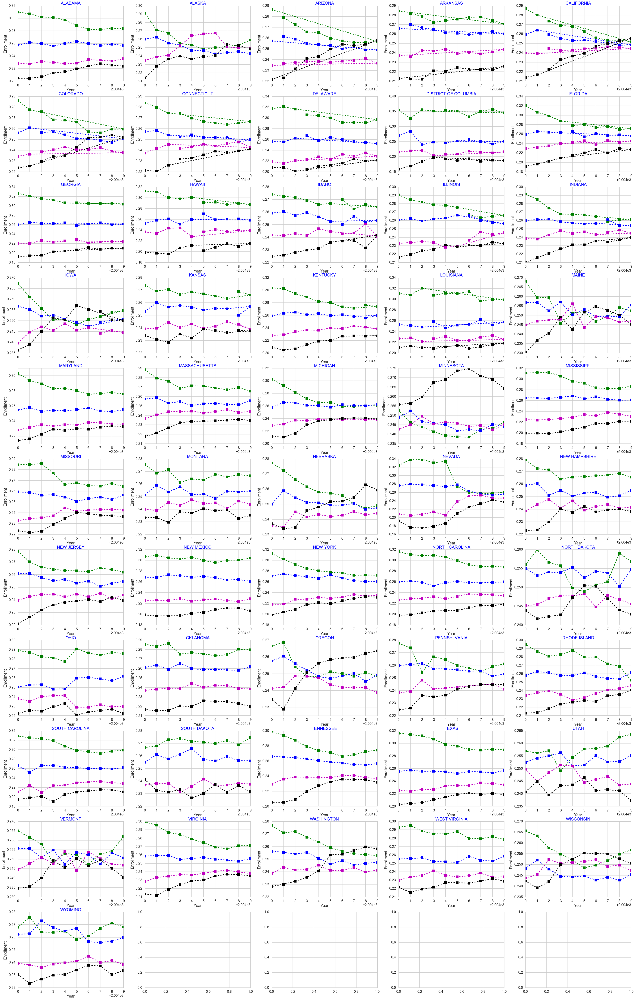

In [90]:
multiplot(enrollment, "Enrollment")

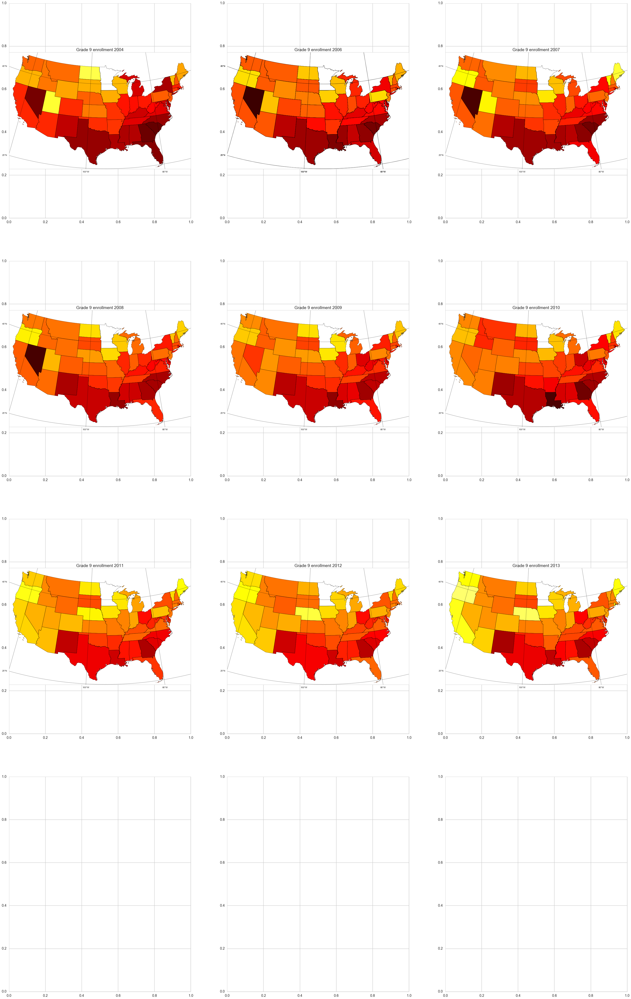

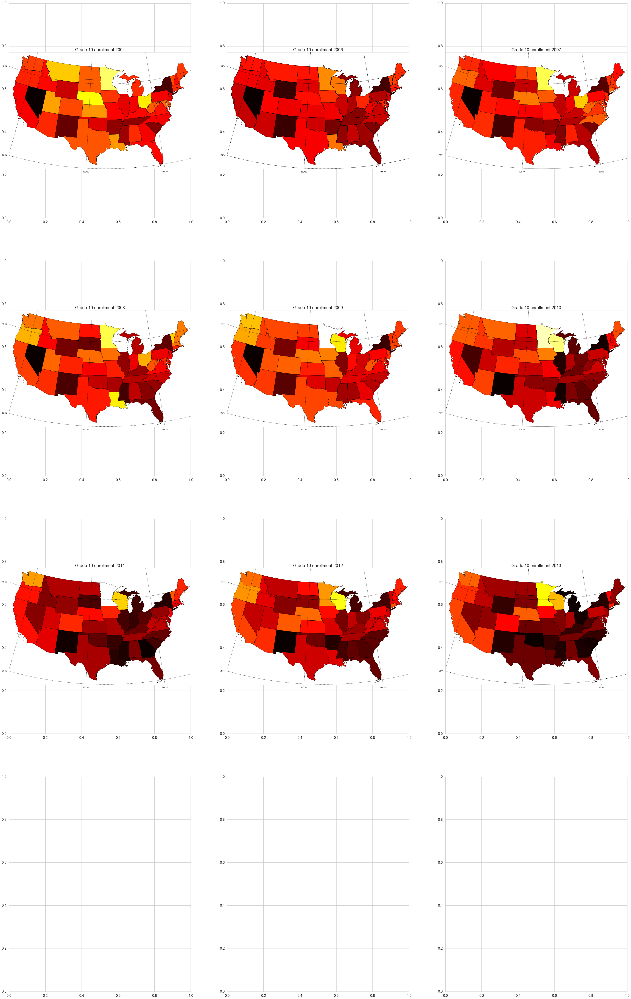

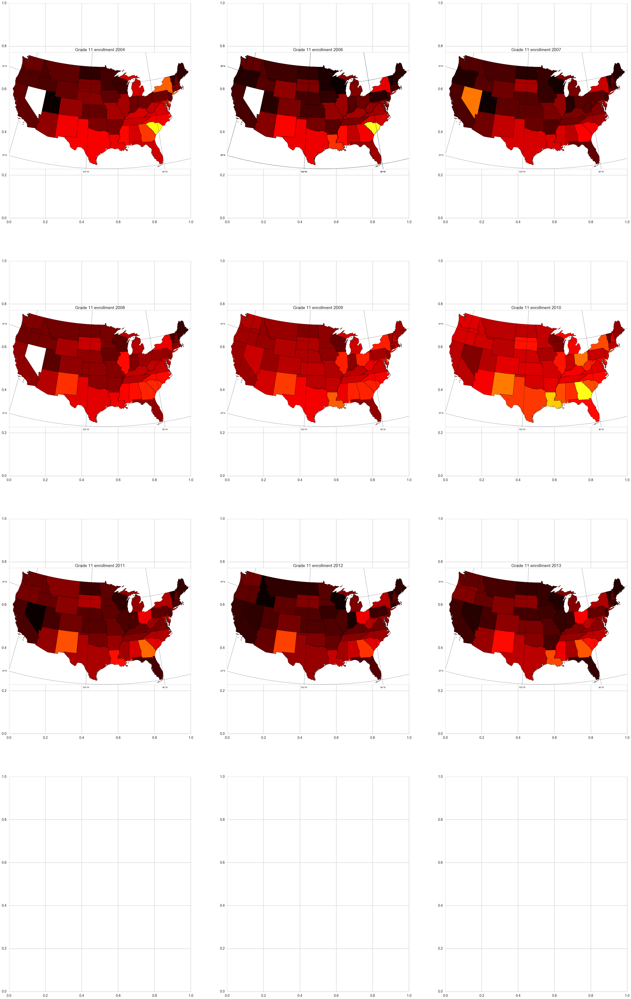

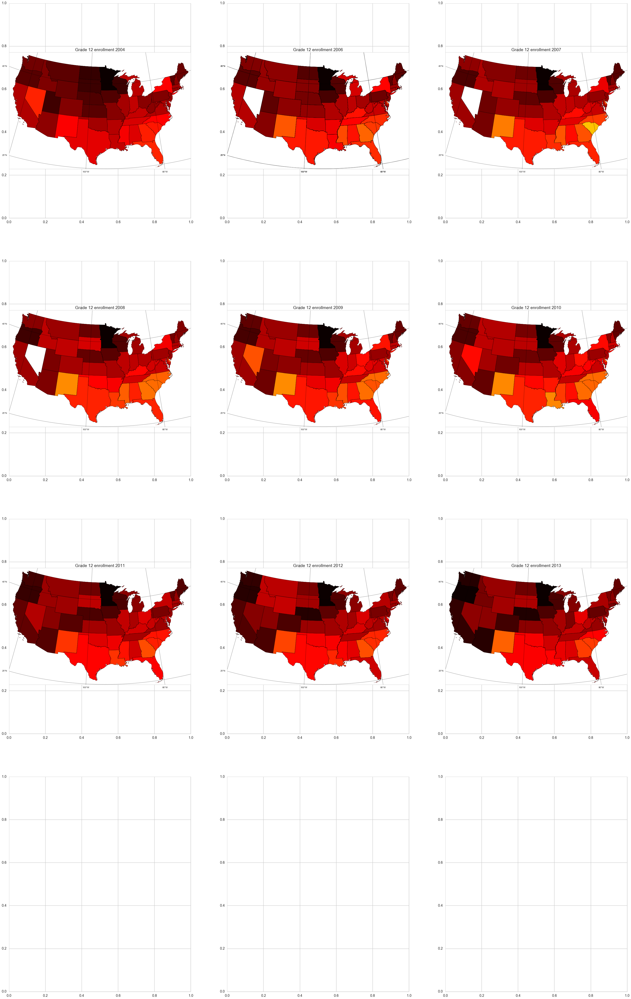

In [91]:
for feature_dict in enrollment:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

In [92]:
####Race and Gender  <a id="race and gender"></a>

In [ ]:
#you can print anything you like!
hispanic_female = [{'column':'hispanic_female_grade_9',
                    'label': 'Hispanic Female G 9',
                    'color': 'g'},
                   {'column':'hispanic_female_grade_10',
                    'label': 'Hispanic Female G 10',
                    'color': 'b'},
                   {'column':'hispanic_female_grade_11',
                    'label': 'Hispanic Female G 11',
                    'color': 'm'},
                   {'column':'hispanic_female_grade_12',
                    'label': 'Hispanic Female G 12',
                    'color': 'k'}]
hispanic_male = [{'column':'hispanic_male_grade_9',
                  'label': 'Hispanic Male G 9',
                  'color': 'g'},
                 {'column':'hispanic_male_grade_10',
                  'label': 'Hispanic Male G 10',
                  'color': 'b'},
                 {'column':'hispanic_male_grade_11',
                  'label': 'Hispanic Male G 11',
                  'color': 'm'},
                 {'column':'hispanic_male_grade_12',
                  'label': 'Hispanic Male G 12',
                  'color': 'k'}]
black_female = [{'column':'black_female_grade_10',
                  'label': 'Black Female G 9',
                  'color': 'g'},
                 {'column':'black_female_grade_11',
                  'label': 'Black Female G 10',
                  'color': 'b'},
                 {'column':'black_female_grade_12',
                  'label': 'Black Female G 11',
                  'color': 'm'},
                 {'column':'black_female_grade_9',
                  'label': 'Black Female G 12',
                  'color': 'k'}]
black_male = [{'column':'black_male_grade_10',
                'label': 'Black Male G 9',
                'color': 'g'},
               {'column':'black_male_grade_11',
                'label': 'Black Male G 10',
                'color': 'b'},
               {'column':'black_male_grade_12',
                'label': 'Black Male G 11',
                'color': 'm'},
               {'column':'black_male_grade_9',
                'label': 'Black Male G 12',
                'color': 'k'}]
asian_female = [{'column':'asian_or_asian_pacific_islander_female_grade_9',
                'label': 'Asian Female G 9',
                'color': 'g'},
               {'column':'asian_or_asian_pacific_islander_female_grade_10',
                'label': 'Asian Female G 10',
                'color': 'b'},
               {'column':'asian_or_asian_pacific_islander_female_grade_11',
                'label': 'Asian Female G 11',
                'color': 'm'},
               {'column':'asian_or_asian_pacific_islander_female_grade_12',
                'label': 'Asian Female G 12',
                'color': 'k'}]
asian_male = [{'column':'asian_or_asian_pacific_islander_male_grade_9',
                'label': 'Asian Male G 9',
                'color': 'g'},
               {'column':'asian_or_asian_pacific_islander_male_grade_10',
                'label': 'Asian Male G 10',
                'color': 'b'},
               {'column':'asian_or_asian_pacific_islander_male_grade_11',
                'label': 'Asian Male G 11',
                'color': 'm'},
               {'column':'asian_or_asian_pacific_islander_male_grade_12',
                'label': 'Asian Male G 12',
                'color': 'k'}]
native_female = [{'column':'american_indian_alaska_native_female_grade_9',
                'label': 'Native Female G 9',
                'color': 'g'},
               {'column':'american_indian_alaska_native_female_grade_10',
                'label': 'Native Female G 10',
                'color': 'b'},
               {'column':'american_indian_alaska_native_female_grade_11',
                'label': 'Native Female G 11',
                'color': 'm'},
               {'column':'american_indian_alaska_native_female_grade_12',
                'label': 'Native Female G 12',
                'color': 'k'}]
native_male = [{'column':'american_indian_alaska_native_male_grade_9',
                'label': 'Native Male G 9',
                'color': 'g'},
               {'column':'american_indian_alaska_native_male_grade_10',
                'label': 'Native Male G 10',
                'color': 'b'},
               {'column':'american_indian_alaska_native_male_grade_11',
                'label': 'Native Male G 11',
                'color': 'm'},
               {'column':'american_indian_alaska_native_male_grade_12',
                'label': 'Native Male G 12',
                'color': 'k'}]
white_female = [{'column':'white_female_grade_9',
                'label': 'White Female G 9',
                'color': 'g'},
               {'column':'white_female_grade_10',
                'label': 'White Female G 10',
                'color': 'b'},
               {'column':'white_female_grade_11',
                'label': 'White Female G 11',
                'color': 'm'},
               {'column':'white_female_grade_12',
                'label': 'White Female G 12',
                'color': 'k'}]
white_male = [{'column':'white_male_grade_9',
                'label': 'White Female G 9',
                'color': 'g'},
               {'column':'white_male_grade_10',
                'label': 'White Female G 10',
                'color': 'b'},
               {'column':'white_male_grade_11',
                'label': 'White Female G 11',
                'color': 'm'},
               {'column':'white_male_grade_12',
                'label': 'White Female G 12',
                'color': 'k'}]

Wall time: 0 ns


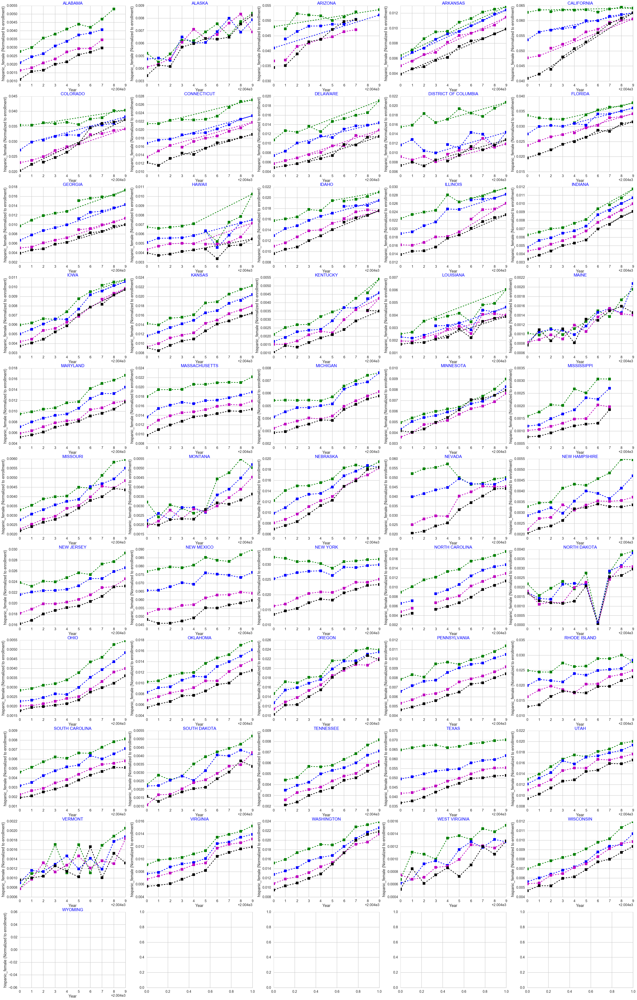

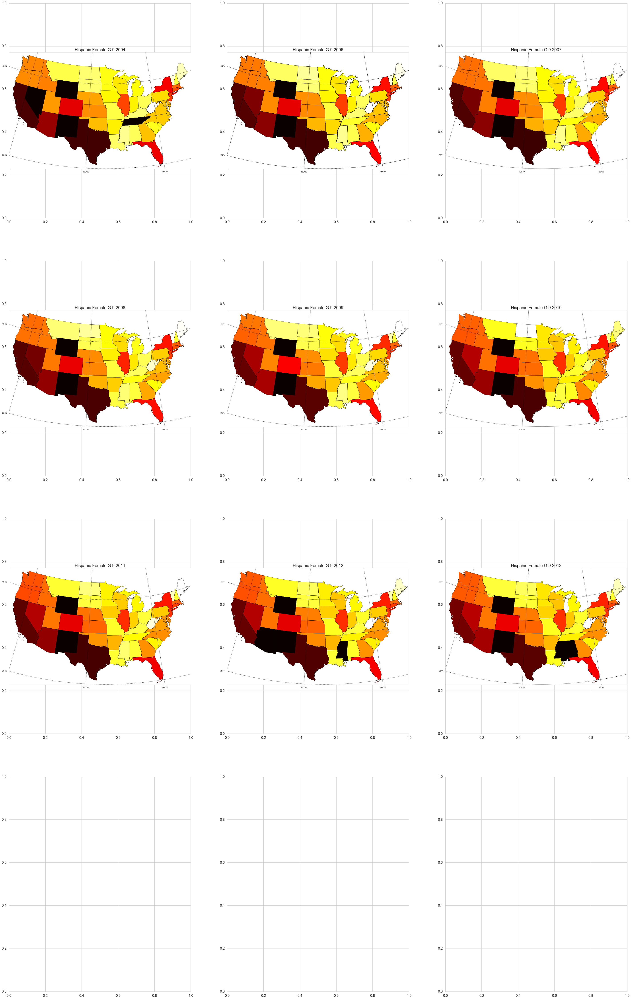

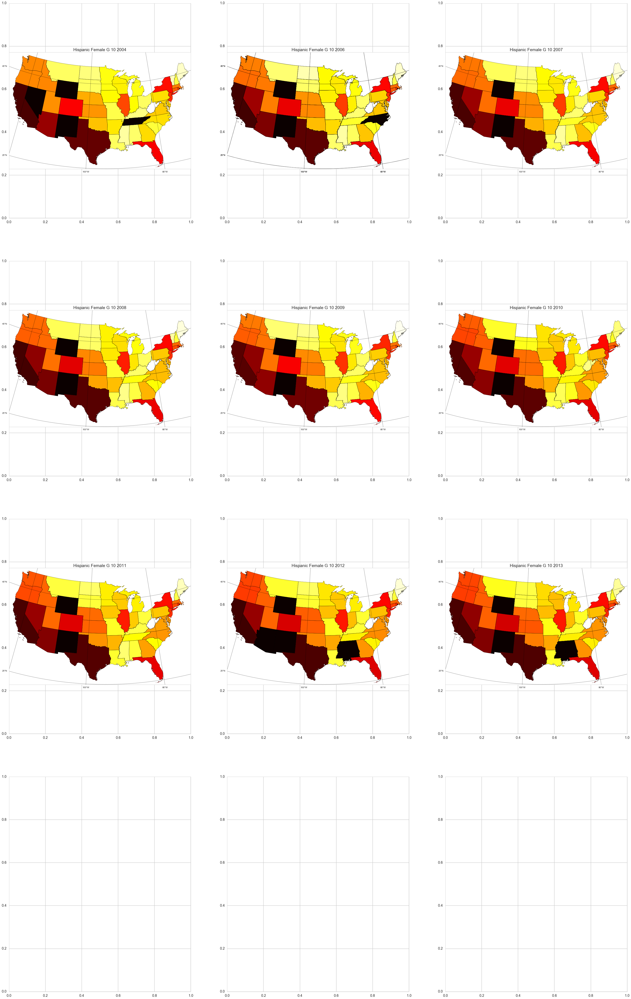

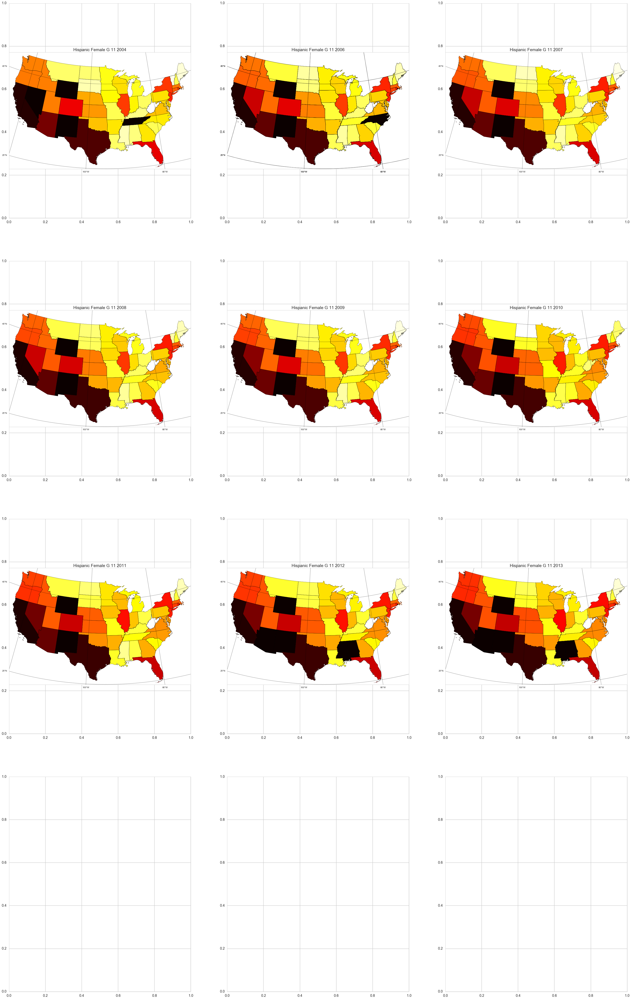

In [ ]:
%time 
multiplot(hispanic_female, "hispanic_female (Normalized to enrollment)")
for feature_dict in hispanic_female:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

multiplot(hispanic_male, "hispanic_male (Normalized to enrollment)")
for feature_dict in hispanic_male:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

multiplot(black_female, "black_female (Normalized to enrollment)")
for feature_dict in black_female:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

multiplot(black_male, "black_male (Normalized to enrollment)")
for feature_dict in black_male:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

multiplot(asian_female, "asian_female (Normalized to enrollment)")
for feature_dict in asian_female:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

multiplot(asian_male, "asian_male (Normalized to enrollment)")
for feature_dict in asian_male:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

multiplot(native_female, "native_female (Normalized to enrollment)")
for feature_dict in native_female:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

multiplot(native_male, "native_male (Normalized to enrollment)")
for feature_dict in native_male:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

multiplot(white_female, "white_female (Normalized to enrollment)")
for feature_dict in white_female:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

multiplot(white_male, "white_male (Normalized to enrollment)")
for feature_dict in white_male:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

###Dropouts  <a id="dropouts"></a>

In [ ]:
dropouts = [{'column':'grade_9_dropouts',
              'label': 'Grade 9 dropouts',
              'color': 'g'},
             {'column':'grade_10_dropouts',
              'label': 'Grade 10 dropouts',
              'color': 'b'},
             {'column':'grade_11_dropouts',
              'label': 'Grade 11 dropouts',
              'color': 'm'},
             {'column':'grade_12_dropouts',
              'label': 'Grade 12 dropouts',
              'color': 'k'}]
multiplot(dropouts, "Dropouts (Normalized to enrollment)")

In [ ]:
for feature_dict in dropouts:
    draw_us_map_multi(df_merged_overall, ifeature=feature_dict['column'], ititle=feature_dict['label'])

In [ ]:
draw_us_map(df_merged_overall, 'no_high_school_diploma', "No High School Diploma")
draw_us_map(df_merged_overall, 'high_school_or_equivalent', "High School or equivalent")
draw_us_map(df_merged_overall, 'some_college_less_than_4_yr_degree', "Some college, less than 4 yrs")
draw_us_map(df_merged_overall, 'bachelors_degree_or_higher', "Bachelors Degree or higher")


In [ ]:
###Pairplot of Secondary Teachers and Dropouts<a id="pairplot"></a>

In [ ]:
# Reference:
# http://stanford.edu/~mwaskom/software/seaborn/generated/seaborn.pairplot.html
g = sns.pairplot(df_merged_2004_onwards, vars=["secondary_teachers", "grade_9_dropouts","grade_10_dropouts",'grade_11_dropouts','grade_12_dropouts'],
                 hue="state_name")